## Setup

In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"

In [2]:
using Muon
using Distances
using StatsPlots
using NewickTreeTools
using Phylo
using SPI
using MAT

In [3]:
using Statistics

In [4]:
pdir = plotsdir("donorspecificity")
mkpath(pdir)

"/Users/ben/projects/Doran_etal_2022/plots/donorspecificity"

In [5]:
biobank = readh5mu(joinpath(datadir(), "exp_pro", "BB673", "BB673.h5mu"))
uniprot = readh5ad(joinpath(datadir(), "exp_pro", "UP7047", "2020_02_UP7047.h5ad"));


In [6]:
# Match BioBank measurements to column order of UniProt
bbmtx = zeros(size(biobank["oggs"].X, 1), length(uniprot.var_names.vals));
rawidxs = indexin(biobank["oggs"].var_names.vals, uniprot.var_names.vals)
bbmask = .!isnothing.(rawidxs)
uporderedmask = filter(x->.!isnothing(x), rawidxs);
bbmtx[:, uporderedmask] .= biobank["oggs"].X[:, :][:, bbmask];

In [7]:
UPvsBB = matread(datadir("exp_pro", "BB673", "UPvsBBdists.mat"))["dists"];
BBspimtx = UPvsBB[7048:end, 7048:end];

## Plot subtree for *B. uniformis*

In [ ]:
inferredeuclidean_hc = hclust(BBspimtx, linkage=:average, branchorder=:optimal)
inferredeuclidean_nws = SPI.nwstr(inferredeuclidean_hc, biobank.obs_names.vals; labelinternalnodes=false);
inferredeuclidean_tree = readnw(inferredeuclidean_nws);

In [ ]:
leaves = NewickTree.getleaves(inferredeuclidean_tree);
leafid = findfirst(x->contains(name(x),"MSK.17.15"), leaves)
compose(f, n) = reduce(∘, ntuple(_ -> f, n))
subtree = compose(parent, 2)(leaves[leafid]);

In [ ]:
plotsubtree = parsenewick(NewickTree.nwstr(subtree))
sort!(plotsubtree)
plot(plotsubtree, rightmargin=4Plots.Measures.cm, lw=7, size=(600, 700))

## Find regions of inter vs. intra species variance

In [8]:
UPusv = SVD(uniprot.obsm["LSVs"][:, :], uniprot.uns["SVs"][:], uniprot.varm["RSVs"][:, :]');

In [9]:
BBuhat = projectinLSV(bbmtx, UPusv);

In [10]:
r_idxs = occursin.("luti", biobank.obs.species) |> findall
b_idxs = occursin.("uniformis", biobank.obs.species) |> findall;
# popat!(b_vulgatus_idxs, occursin.("MSK.7.24", biobank.obs_names[b_vulgatus_idxs]) |> findfirst)
donorid = biobank.obs_names |>
    v -> split.(v, ".") |>
    v -> getindex.(v, 2) |>
    v -> parse.(Int,v)

b_idxs = b_idxs[sortperm(donorid[b_idxs])]
r_idxs = r_idxs[sortperm(donorid[r_idxs])]

idxs = union(b_idxs,  r_idxs);

In [11]:
pairedtraces = calc_spi_trace(BBuhat[idxs,:], UPusv.S, getintervals(UPusv.S));

In [12]:
SPItraces = mapslices(cumsum, pairedtraces, dims=1);

In [13]:
size(SPItraces)

(880, 1275)

In [15]:
biobank.obs.phylum[idxs] |> unique

2-element Vector{String}:
 "Bacteroidetes"
 "Firmicutes"

In [16]:
lowertriangle = tril(trues(length(idxs), length(idxs)), -1);

phylumid = biobank.obs.species
phylumpairmask = pairwise(!=, phylumid[idxs])[lowertriangle]

speciesid = biobank.obs.species
speciespairs = pairwise(==, speciesid[idxs])[lowertriangle]

donorid = biobank.obs_names |>
    v -> split.(v, ".") |>
    v -> getindex.(v, 2)
donorpairs = pairwise(==, donorid[idxs])[lowertriangle]
donorpairmask = donorpairs .&& speciespairs
speciespairmask = speciespairs .&& (.!donorpairmask);

In [17]:
sum(phylumpairmask), sum(speciespairmask), sum(donorpairmask)

(648, 561, 66)

In [18]:
(sum(phylumpairmask), sum(speciespairmask), sum(donorpairmask)) |> sum

1275

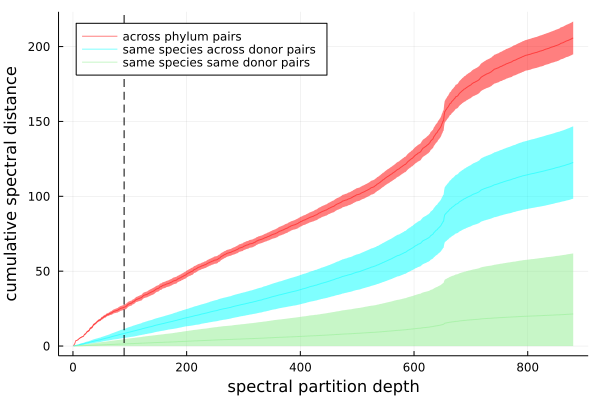

In [40]:
plot(legend=:topleft, ylabel="cumulative spectral distance", xlabel="spectral partition depth")
p_mean = mapslices(mean, SPItraces[:, phylumpairmask], dims=2)[:]
p_std = mapslices(std, SPItraces[:, phylumpairmask], dims=2)[:];
plot!(p_mean, ribbon=p_std, c=:red, alpha=.5, label="across phylum pairs")

s_mean = mapslices(mean, SPItraces[:, speciespairmask], dims=2)[:]
s_std = mapslices(std, SPItraces[:, speciespairmask], dims=2)[:];
plot!(s_mean, ribbon=s_std, c=:aqua, alpha=.5, label="same species across donor pairs")

d_mean = mapslices(mean, SPItraces[:, donorpairmask], dims=2)[:]
d_std = mapslices(std, SPItraces[:, donorpairmask], dims=2)[:];
plt_y = (ifelse.(d_std ≥ d_mean, d_mean, d_std), d_std)
plot!(d_mean, ribbon=plt_y, c=:lightgreen, alpha=.5, label="same species same donor pairs")
vline!([90], c=:black, linestyle=:dash, label="")


In [41]:
savefig(joinpath(pdir, "SPItraces_mean-plusminus-std_of_Bluti_and_Buniformis.pdf"))

In [ ]:
plot(legend=:topleft, ylabel="cumulative spectral distance", xlabel="spectral partition depth")
plot!(SPItraces[:, donorpairmask], c=:lightgreen, alpha=.2, label="")
plot!(SPItraces[:, speciespairmask], c=:aqua, alpha=.2, label="")
plot!(SPItraces[:, phylumpairmask], c=:red, alpha=.2, label="")
plot!([0 0 0], c=[:red :aqua :lightgreen], 
    label=["Blautia luti:Bacteroides uniformis pairs" "within species across donor pairs" "within species and donor pairs"])
vline!([90], c=:black, linestyle=:dash, label="")

In [ ]:
savefig(joinpath(pdir, "SPItraces_of_Bluti_and_Buniformis.pdf"))

## Make heatmaps of spectrally filtered relative OGG values

In [42]:
partitions = getintervals(UPusv.S);

In [46]:
sMprime = BBuhat[idxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
dMprime = BBuhat[idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

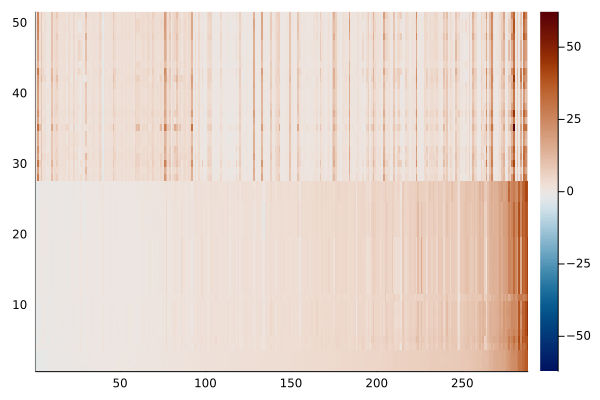

In [47]:
differentialgenes = findall(>(1), mapslices(var, sMprime, dims=1)[:])
cl = maximum(abs.(extrema(sMprime[:, differentialgenes])))
cls = (-cl, cl)
# hc = hclust(pairwise(Euclidean(), sMprime[:, differentialgenes]), branchorder=:optimal)
heatmap(sMprime[:, differentialgenes[sortperm(sMprime[1, differentialgenes])]], c=:vik, clims=cls)

In [ ]:
savefig(joinpath(pdir, "diffspecies_mprime_1-90spdepth_heatmap.pdf"))

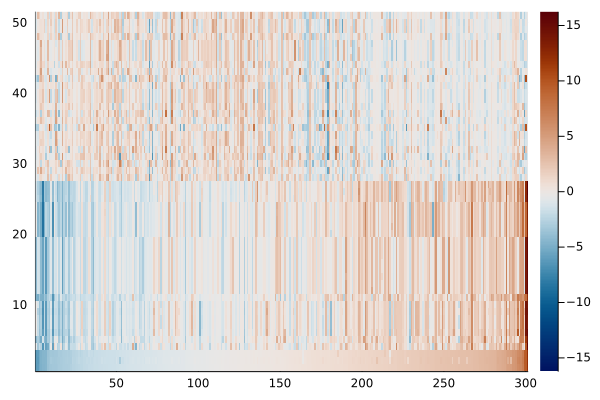

In [48]:
differentialgenes = findall(>(1), mapslices(var, dMprime, dims=1)[:])
cl = maximum(abs.(extrema(dMprime[:, differentialgenes])))
cls = (-cl, cl)
heatmap(dMprime[:, differentialgenes[sortperm(dMprime[1, differentialgenes])]], c=:vik, clims=cls)

In [ ]:
savefig(joinpath(pdir, "samespeciessamedonor_mprime_91-880spdepth_heatmap.pdf"))

In [ ]:
differentialgenes = findall(>(1), mapslices(var, sMprime, dims=1)[:])


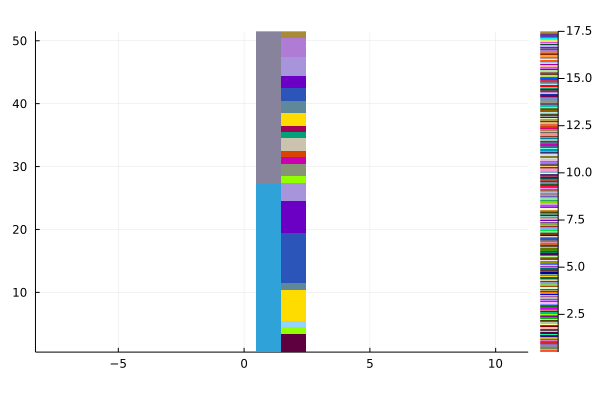

In [49]:
heatmap(hcat(speciesid[idxs], donorid[idxs]), c=:glasbey_hv_n256, ratio=.25)

In [ ]:
savefig(joinpath(pdir, "species_donor_catagories_heatmap.pdf"))

In [57]:
variablegenes_spe = findall(>(1), mapslices(var, sMprime, dims=1)[:])
variablegenes_don = findall(>(1), mapslices(var, dMprime, dims=1)[:]);

spe_only = setdiff(variablegenes_spe, variablegenes_don)
sp_n_don = intersect(variablegenes_don, variablegenes_spe)
don_only = setdiff(variablegenes_don, variablegenes_spe);

In [99]:
length(spe_only), length(sp_n_don), length(don_only)

(131, 157, 144)

In [59]:
plt_spe_var = hcat(
    mapslices(var, bbmtx[:, spe_only], dims=1)[:],
    mapslices(var, sMprime[:, spe_only], dims=1)[:],
    mapslices(var, dMprime[:, spe_only], dims=1)[:],
);
plt_bth_var = hcat(
    mapslices(var, bbmtx[:, sp_n_don], dims=1)[:],
    mapslices(var, sMprime[:, sp_n_don], dims=1)[:],
    mapslices(var, dMprime[:, sp_n_don], dims=1)[:],
);
plt_don_var = hcat(
    mapslices(var, bbmtx[:, don_only], dims=1)[:],
    mapslices(var, sMprime[:, don_only], dims=1)[:],
    mapslices(var, dMprime[:, don_only], dims=1)[:],
);

In [63]:
windowcolors=["#9b9b9b" :aqua :lightgreen]

1×3 Matrix{Any}:
 "#9b9b9b"  :aqua  :lightgreen

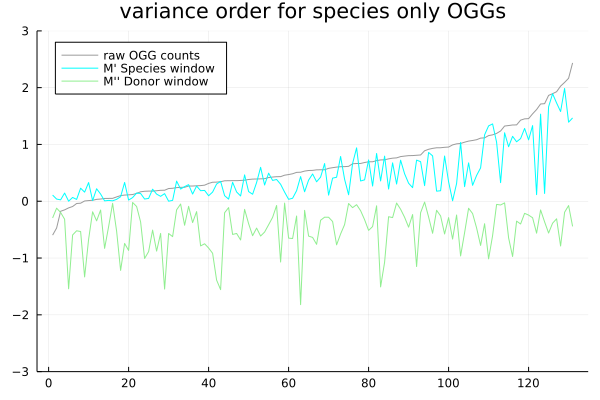

In [64]:
plot(log10.(plt_spe_var[sortperm(plt_spe_var[:, 1]), :]), 
    title="variance order for species only OGGs",
    legend=:topleft,
    ylims=(-3,3),
    labels=["raw OGG counts" "M' Species window" "M'' Donor window"],
    c=windowcolors
    )

In [65]:
savefig(joinpath(pdir, "variance-order-for-species-only-OGGs.pdf"))

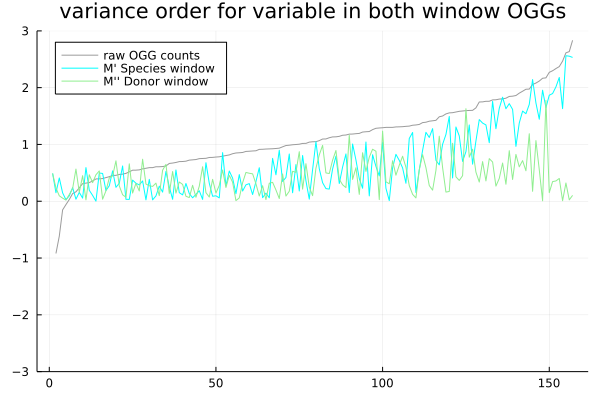

In [66]:
plot(log10.(plt_bth_var[sortperm(plt_bth_var[:, 1]), :]), 
    title="variance order for variable in both window OGGs",
    ylims=(-3,3),
    legend=:topleft,
    labels=["raw OGG counts" "M' Species window" "M'' Donor window"],
    c=windowcolors,
)

In [67]:
savefig(joinpath(pdir, "variance-order-for-variable-in-both-window-OGGs.pdf"))

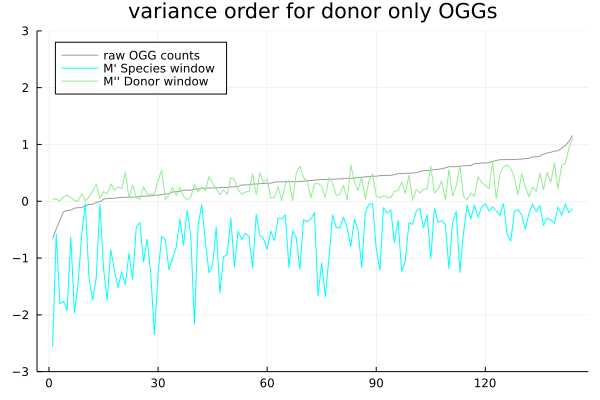

In [68]:
plot(log10.(plt_don_var[sortperm(plt_don_var[:, 1]), :]), 
    title="variance order for donor only OGGs",
    legend=:topleft,
    ylims=(-3,3),
    labels=["raw OGG counts" "M' Species window" "M'' Donor window"],
    c=windowcolors
)

In [69]:
savefig(joinpath(pdir, "variance-order-for-donor-only-OGGs.pdf"))

In [70]:
allVariableOGGs = vcat(
     spe_only[sortperm(plt_spe_var[:, 1])],
     sp_n_don[sortperm(plt_bth_var[:, 1])],
     don_only[sortperm(plt_don_var[:, 1])],
     );

In [72]:
pltvarforvarOGGs = hcat(
    mapslices(var, bbmtx[:, allVariableOGGs], dims=1)[:],
    mapslices(var, sMprime[:, allVariableOGGs], dims=1)[:],
    mapslices(var, dMprime[:, allVariableOGGs], dims=1)[:],
);

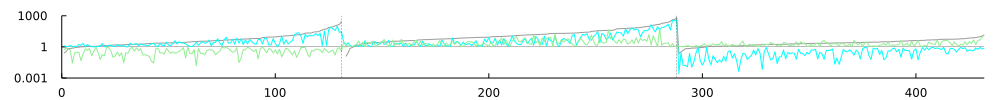

In [92]:
plot( # title="Variance of OGGs"
    size=(1000, 100),
    grid=false,
    ylims=(-3,3),
    xlims=(0, size(pltvarforvarOGGs,1)),
    yticks=([-3, 0, 3], ["0.001", "1", "1000"]),
    legend=:none,
    margin=2Plots.Measures.mm,
)
hline!([0], c=:black, lw=0.25)
plot!(log10.(pltvarforvarOGGs),
    labels=["raw OGG counts" "M' Species window" "M'' Donor window"],
    c=windowcolors,
)
vline!([length(spe_only), length(spe_only)+length(sp_n_don)], c=:black, linestyle=:dash, lw=.25)

In [93]:
savefig(joinpath(pdir, "variance-order-for-LutiUniformis-variable-OGGs.pdf"))

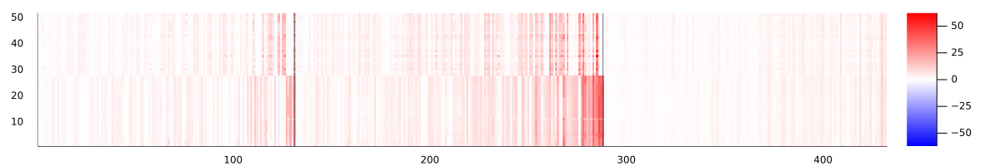

In [106]:
cls = sMprime[:, allVariableOGGs] |> extrema |> x->abs.(x) |> maximum |> x->(-x, x)
plot( # title="Heatmap of species window variable OGGs"
    size=(1200, 200),
    margin=2Plots.Measures.mm,    
)
heatmap!(sMprime[:, allVariableOGGs], c=:bwr, clims=cls)
vline!([length(spe_only), length(spe_only)+length(sp_n_don)], c=:black, linestyle=:solid, lw=.5, label="")

In [107]:
savefig(joinpath(pdir, "heatmap_specieswindow_Mprime_allvariableOGGs.pdf"))

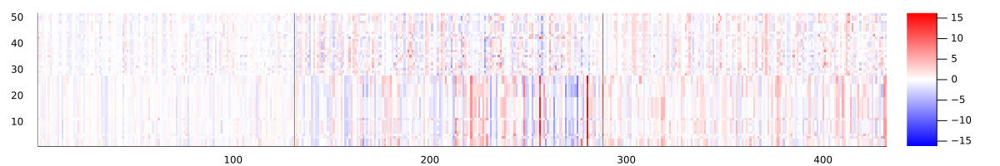

In [108]:
cls = dMprime[:, allVariableOGGs] |> extrema |> x->abs.(x) |> maximum |> x->(-x, x)
plot( # title="Heatmap of species window variable OGGs"
    size=(1200, 200),
    margin=2Plots.Measures.mm,    
)
heatmap!(dMprime[:, allVariableOGGs], c=:bwr, clims=cls)
vline!([length(spe_only), length(spe_only)+length(sp_n_don)], c=:black, linestyle=:solid, lw=.5, label="")

In [109]:
savefig(joinpath(pdir, "heatmap_donorwindow_Mprime_allvariableOGGs.pdf"))

## Plot density of variance within and across species

In [110]:
r_idxs = occursin.("luti", biobank.obs.species) |> findall
b_idxs = occursin.("uniformis", biobank.obs.species) |> findall;
# popat!(b_vulgatus_idxs, occursin.("MSK.7.24", biobank.obs_names[b_vulgatus_idxs]) |> findfirst)
donorid = biobank.obs_names |>
    v -> split.(v, ".") |>
    v -> getindex.(v, 2) |>
    v -> parse.(Int,v)

b_idxs = b_idxs[sortperm(donorid[b_idxs])]
r_idxs = r_idxs[sortperm(donorid[r_idxs])]

idxs = vcat(b_idxs,  r_idxs);

In [112]:
sMprime_a = BBuhat[idxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
sMprime_b = BBuhat[b_idxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
sMprime_l = BBuhat[r_idxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
dMprime_a = BBuhat[idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];
dMprime_b = BBuhat[b_idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];
dMprime_l = BBuhat[r_idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

In [114]:
filter(>(1), mapslices(var, sMprime_a, dims=1)[:]);

In [116]:
groupcolors = ["#B8A57D" "#02A3A3" "#A57DB8"]

1×3 Matrix{String}:
 "#B8A57D"  "#02A3A3"  "#A57DB8"

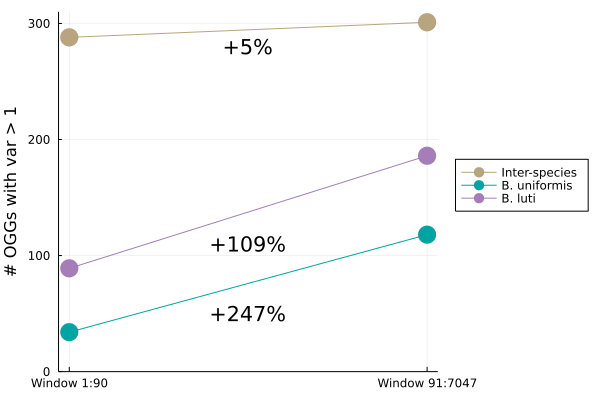

In [158]:
numvariableOGGs = [
    filter(>(1), mapslices(var, sMprime_a, dims=1)[:])|>length filter(>(1), mapslices(var, sMprime_b, dims=1)[:])|>length filter(>(1), mapslices(var, sMprime_l, dims=1)[:])|>length;
    filter(>(1), mapslices(var, dMprime_a, dims=1)[:])|>length filter(>(1), mapslices(var, dMprime_b, dims=1)[:])|>length filter(>(1), mapslices(var, dMprime_l, dims=1)[:])|>length;
]

plot(
    ylims=(0,310),
    ylabel="# OGGs with var > 1",
    xticks=(1:2, ["Window 1:90", "Window 91:7047"]),
    legend=:outerright)
plot!(numvariableOGGs, 
    labels=["Inter-species" "B. uniformis" "B. luti"], 
    c=groupcolors, 
    markers=true,
    markerstrokewidth=0,
    markersize=10,
    )
annotate!([1.5, 1.5, 1.5],[280, 110, 50], ["+5%", "+109%", "+247%"])

In [159]:
savefig(joinpath(pdir, "increase_of_variablegenes_based_on_spectral_region.pdf"))

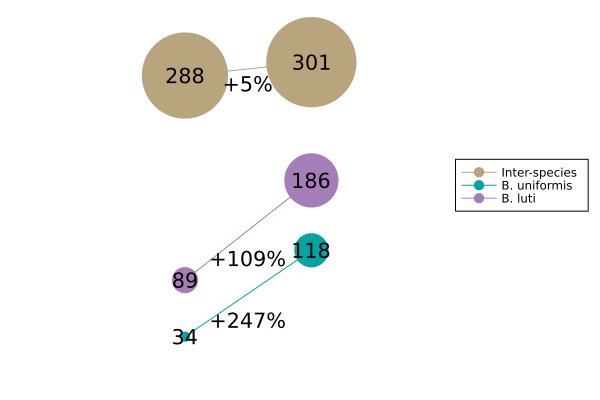

In [156]:
plot(
    ylims=(0,350),
    xlims=(0,3),
    ylabel="# OGGs with var > 1",
    xticks=(1:2, ["Window 1:90", "Window 91:7047"]),
    grid=false,
    framestyle=:none,
    legend=:outerright)
plot!(numvariableOGGs, 
    labels=["Inter-species" "B. uniformis" "B. luti"], 
    c=groupcolors, 
    markers=true,
    # markerstrokestyle=[:dash :dot :dash; :solid :dot :solid],
    markerstrokewidth=0,
    markersize=numvariableOGGs/maximum(numvariableOGGs)*50,
    )
annotate!([1 1 1; 2 2 2][:], numvariableOGGs[:], string.(numvariableOGGs)[:])
annotate!([1.5, 1.5, 1.5],[280, 110, 50], ["+5%", "+109%", "+247%"])

In [157]:
savefig(joinpath(pdir, "increase_of_variablegenes_based_on_spectral_region_bubble.pdf"))

## Shared OGGs across conditions

In [ ]:
numvariableOGGs

In [ ]:
# percent increase of variable genes between the two windows
(numvariableOGGs[2,:] ./ numvariableOGGs[1,:] .- 1) .* 100

In [ ]:
pOGGs_a = findall(>(1), mapslices(var, pMprime, dims=1)[:]) 
dOGGs_a = findall(>(1), mapslices(var, dMprime, dims=1)[:]) 
pOGGs_b = findall(>(1), mapslices(var, pMprime_b, dims=1)[:]) 
dOGGs_b = findall(>(1), mapslices(var, dMprime_b, dims=1)[:]) 
pOGGs_r = findall(>(1), mapslices(var, pMprime_r, dims=1)[:])
dOGGs_r = findall(>(1), mapslices(var, dMprime_r, dims=1)[:]);

In [ ]:
outdir = datadir("exp_pro", "BB673", "variableOGGs") |> mkpath
filenames = [
    "wind1-90_Buniformis-Bluti", 
    "wind91-7047_Buniformis-Bluti",
    "wind1-90_Buniformis", 
    "wind91-7047_Buniformis",
    "wind1-90_Bluti", 
    "wind91-7047_Bluti"
]
for (filename, list) in zip(filenames, [pOGGs_a, dOGGs_a, pOGGs_b, dOGGs_b, pOGGs_r, dOGGs_r])
    open(joinpath(outdir, filename * ".txt"), "w") do io
        println.([io], list)
    end
end

In [ ]:
setdiff(pOGGs_a, dOGGs_a)|>length, intersect(pOGGs_a, dOGGs_a)|>length, setdiff(dOGGs_a, pOGGs_a)|>length, union(pOGGs_a, dOGGs_a)|>length

In [ ]:
setdiff(pOGGs_b, dOGGs_b)|>length, intersect(pOGGs_b, dOGGs_b)|>length, setdiff(dOGGs_b, pOGGs_b)|>length, union(pOGGs_b, dOGGs_b)|>length

In [ ]:
setdiff(pOGGs_r, dOGGs_r)|>length, intersect(pOGGs_r, dOGGs_r)|>length, setdiff(dOGGs_r, pOGGs_r)|>length, union(pOGGs_r, dOGGs_r)|>length

## Fractional Variance in shallow 1:90 window compared to 91:7047 window

In [ ]:
fractionalvariance = UPusv.S.^2 ./ sum(UPusv.S.^2);

In [ ]:
sum(fractionalvariance[1:90])

In [ ]:
sum(fractionalvariance[91:end])

## Variable OGGs for *B. Uniformis*

In [ ]:
variable_Buniformis_idxs = [2758,1308,2143,474,2958,3505,5086,912,1227]

In [ ]:
dMprime_r[:, variable_Buniformis_idxs]

In [ ]:
plot(
    title="Variable OGGs within B. uniformis only",
    ylabel="Spectral abundunce",
    size=(500,250),
    xticks=(1:length(variable_Buniformis_idxs), uniprot.var_names[variable_Buniformis_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(variable_Buniformis_idxs)
    violin!([i], dMprime_b[:, variable_Buniformis_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], dMprime_r[:, variable_Buniformis_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], dMprime_b[:, variable_Buniformis_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], dMprime_r[:, variable_Buniformis_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
plot!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-within-Buniformis-only_spectralwindow-91to7047.pdf"))

In [ ]:
plot(
    title="Variable OGGs within B. uniformis only",
    ylabel="raw OGG abundunce",
    size=(500,250),
    xticks=(1:length(variable_Buniformis_idxs), uniprot.var_names[variable_Buniformis_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(variable_Buniformis_idxs)
    violin!([i], bbmtx[b_idxs, variable_Buniformis_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], bbmtx[r_idxs, variable_Buniformis_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], bbmtx[b_idxs, variable_Buniformis_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[r_idxs, variable_Buniformis_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
violin!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-within-Buniformis-only_spectralwindow-91to7047_rawabundence.pdf"))

In [ ]:
uniprot.var_names[variable_Buniformis_idxs]

**Variable OGGS in B. Uniformis only**

OGG | EggNog 5.0 description | GO Funtion | KEGG ID | KEGG pathway | Most frequent PFAM domain  | PFAM function
---|---|---|---|---|---|---
COG3506 | Protein of unknown function (DUF1349) | unknown | K09702 | unknown | DUF1349 | unknown
COG1511 | domain protein | transport,localization | K01421 | putative membrane protein | ABC2_membrane_3 | ATP-binding cassette transporter
COG2842 | AAA domain | nucleic acid metabolic process | - | - | AAA_22 | ATPases Associated with various cellular Activities
COG0476 | Involved in molybdopterin and thiamine biosynthesis, family 2 | cellular metabolic process | K21029 | Sulfur relay system | ThiF | ubiquitin activating E1 family
COG3712 | iron ion homeostasis | regulation of biological quality | K07165 | Two-component system, transmembrane sensor | FecR | regulation of iron dicitrate transport
COG4464 | protein tyrosine phosphatase activity | peptidyl-tyrosine dephosphorylation | K01104 | protein-tyrosine-phosphatase | - | -
2Z9FZ | Psort location Cytoplasmic, score 8.96 | - | - | - | PcfJ | unknown
COG1066 | DNA-dependent ATPase | nitrogen compound metabolic process | K04485 | DNA repair protein RadA/Sms| AAA_25 | This AAA domain is found in a wide variety of presumed DNA repair proteins
COG1413 | deoxyhypusine monooxygenase activity | organonitrogen compound metabolic process | - | - | HEAT_2 | often involved in intracellular transport

In [ ]:
uniprot.var[variable_Buniformis_idxs, [:og, :description]]

## Variable OGGs for *B. luti*

In [ ]:
# variable_Bluti_idxs = [
#     1020,978,1979,2846,3906,389,495,2046,1558,594,1101,2359,3735,835,3987,
#     3893,1618,1089,2919,4154,3125,1497,3011,5077,3352,1621,400,1280,1838,
#     1966,1590,1412,1210,3114,1793,4067,2928,5932,4243,2157,4575,1913
# ];
variable_Bluti_idxs = setdiff(dOGGs_r, dOGGs_a, dOGGs_b);

In [ ]:
mostvariable_Bluti_idxs = variable_Bluti_idxs[partialsortperm(mapslices(var, dMprime_r[:, variable_Bluti_idxs], dims=1)[:], 1:10, rev=true)]

In [ ]:
contains.("Firmicutes", biobank.obs.phylum) |> sum

In [ ]:
violin(bbmtx[contains.("Bacteroidetes", biobank.obs.phylum), [2359]])
violin!(bbmtx[contains.("Firmicutes", biobank.obs.phylum), [2359]])

In [ ]:
dMprime_r[:, mostvariable_Bluti_idxs]

In [ ]:
plot(
    title="Variable OGGs within B. luti only",
    ylabel="Spectral abundunce",
    size=(500,250),
    xticks=(1:length(mostvariable_Bluti_idxs), uniprot.var_names[mostvariable_Bluti_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(mostvariable_Bluti_idxs)
    violin!([i], dMprime_b[:, mostvariable_Bluti_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], dMprime_r[:, mostvariable_Bluti_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], dMprime_b[:, mostvariable_Bluti_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], dMprime_r[:, mostvariable_Bluti_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
plot!()

In [ ]:
savefig(joinpath(pdir, "MostVariable-OGGs-within-Bluti-only_spectralwindow-91to7047.pdf"))

In [ ]:
plot(
    title="Variable OGGs within B. luti only",
    ylabel="raw OGG abundunce",
    size=(500,250),
    xticks=(1:length(mostvariable_Bluti_idxs), uniprot.var_names[mostvariable_Bluti_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(mostvariable_Bluti_idxs)
    violin!([i], bbmtx[b_idxs, mostvariable_Bluti_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], bbmtx[r_idxs, mostvariable_Bluti_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], bbmtx[b_idxs, mostvariable_Bluti_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[r_idxs, mostvariable_Bluti_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
violin!()

In [ ]:
savefig(joinpath(pdir, "MostVariable-OGGs-within-Bluti-only_spectralwindow-91to7047_rawabundence.pdf"))

In [ ]:
uniprot.var_names[mostvariable_Bluti_idxs]

**Variable OGGS in B. luti only**

OGG | EggNog 5.0 description | GO Funtion | KEGG ID | KEGG pathway | Most frequent PFAM domain  | PFAM function
---|---|---|---|---|---|---
2Z9EJ | Psort location Cytoplasmic, score | - | - | - | Transposase_31 | Putative transposase, YhgA-like
COG2340 | peptidase inhibitor activity | biological regulation | - | - | CAP, HemolysinCabind | secreted and have an extracellular endocrine or paracrine function, calcium binding
COG2452 | recombinase activity | DNA recombination | - | - | HTH_17 | DNA binding helix-turn-helix domain.
COG1737 | DNA-binding transcription factor activity | metabolic process | - | - | HTH_6 | DNA binding helix-turn-helix domain
2ZTUJ | Bacterial mobilisation protein (MobC) | - | - | - | MobC | Bacterial mobilisation
COG0596 | hydrolase activity, acting on ester bonds | metabolic process | - | - | Abhydrolase_1 | This family contains alpha/beta hydrolase enzymes of diverse specificity
COG3064 | translation initiation factor activity | cellular process | - | - | PorP_SprF | Type IX secretion system membrane protein PorP/SprF 
COG2856 | Zn peptidase | primary metabolic process | - | - | Peptidase_M78 | metallopeptidase containing an HEXXH zinc-binding motif
COG5632 | N-Acetylmuramoyl-L-alanine amidase | glycosaminoglycan metabolic process | K01447 | xlyAB; N-acetylmuramoyl-L-alanine amidase | Amidase_2 | zinc amidases that have N-acetylmuramoyl-L-alanine amidase activity
COG1813 | peptidyl-tyrosine sulfation | biological regulation | K03627 | putative transcription factor | HTH_3 | helix-turn-helix DNA-binding protein domain

In [ ]:
uniprot.var[mostvariable_Bluti_idxs, [:og, :description]]

## Variable OGGs for *B. Uniformis*

In [ ]:
# variable_Buniformis_idxs = [2758,1308,2143,474,2958,3505,5086,912,1227];
variable_Buniformis_idxs = setdiff(dOGGs_b, dOGGs_a, dOGGs_r)

In [ ]:
dMprime_r[:, variable_Buniformis_idxs]

In [ ]:
plot(
    title="Variable OGGs within B. uniformis only",
    ylabel="Spectral abundunce",
    size=(500,250),
    xticks=(1:length(variable_Buniformis_idxs), uniprot.var_names[variable_Buniformis_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(variable_Buniformis_idxs)
    violin!([i], dMprime_b[:, variable_Buniformis_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], dMprime_r[:, variable_Buniformis_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], dMprime_b[:, variable_Buniformis_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], dMprime_r[:, variable_Buniformis_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
plot!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-within-Buniformis-only_spectralwindow-91to7047.pdf"))

In [ ]:
plot(
    title="Variable OGGs within B. uniformis only",
    ylabel="raw OGG abundunce",
    size=(500,250),
    xticks=(1:length(variable_Buniformis_idxs), uniprot.var_names[variable_Buniformis_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(variable_Buniformis_idxs)
    violin!([i], bbmtx[b_idxs, variable_Buniformis_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], bbmtx[r_idxs, variable_Buniformis_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], bbmtx[b_idxs, variable_Buniformis_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[r_idxs, variable_Buniformis_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
violin!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-within-Buniformis-only_spectralwindow-91to7047_rawabundence.pdf"))

In [ ]:
uniprot.var_names[variable_Buniformis_idxs]

**Variable OGGS in B. Uniformis only**

OGG | EggNog 5.0 description | GO Funtion | KEGG ID | KEGG pathway | Most frequent PFAM domain  | PFAM function
---|---|---|---|---|---|---
COG3506 | Protein of unknown function (DUF1349) | unknown | K09702 | unknown | DUF1349 | unknown
COG1511 | domain protein | transport,localization | K01421 | putative membrane protein | ABC2_membrane_3 | ATP-binding cassette transporter
COG2842 | AAA domain | nucleic acid metabolic process | - | - | AAA_22 | ATPases Associated with various cellular Activities
COG0476 | Involved in molybdopterin and thiamine biosynthesis, family 2 | cellular metabolic process | K21029 | Sulfur relay system | ThiF | ubiquitin activating E1 family
COG3712 | iron ion homeostasis | regulation of biological quality | K07165 | Two-component system, transmembrane sensor | FecR | regulation of iron dicitrate transport
COG4464 | protein tyrosine phosphatase activity | peptidyl-tyrosine dephosphorylation | K01104 | protein-tyrosine-phosphatase | - | -
2Z9FZ | Psort location Cytoplasmic, score 8.96 | - | - | - | PcfJ | unknown
COG1066 | DNA-dependent ATPase | nitrogen compound metabolic process | K04485 | DNA repair protein RadA/Sms| AAA_25 | This AAA domain is found in a wide variety of presumed DNA repair proteins
COG1413 | deoxyhypusine monooxygenase activity | organonitrogen compound metabolic process | - | - | HEAT_2 | often involved in intracellular transport

In [ ]:
uniprot.var[variable_Buniformis_idxs, [:og, :description]]

## Variable OGG *B. luti* vs. *B. uniformis*

In [ ]:
pOGGs_a = findall(>(1), mapslices(var, pMprime, dims=1)[:]) 
dOGGs_a = findall(>(1), mapslices(var, dMprime, dims=1)[:]) 
pOGGs_b = findall(>(1), mapslices(var, pMprime_b, dims=1)[:]) 
dOGGs_b = findall(>(1), mapslices(var, dMprime_b, dims=1)[:]) 
pOGGs_r = findall(>(1), mapslices(var, pMprime_r, dims=1)[:])
dOGGs_r = findall(>(1), mapslices(var, dMprime_r, dims=1)[:]);

In [ ]:
variable_across_species_idxs = setdiff(pOGGs_a, pOGGs_b, pOGGs_r, dOGGs_a, dOGGs_b, dOGGs_r);
@show size(variable_across_species_idxs);

In [ ]:
mostvariable_acrossspecies_idxs = variable_across_species_idxs[partialsortperm(mapslices(var, pMprime[:, variable_across_species_idxs], dims=1)[:], 1:10, rev=true)]

In [ ]:
plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="Spectral abundunce",
    size=(500,250),
    xticks=(1:length(mostvariable_acrossspecies_idxs), uniprot.var_names[mostvariable_acrossspecies_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(mostvariable_acrossspecies_idxs)
    violin!([i], pMprime_b[:, mostvariable_acrossspecies_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], pMprime_r[:, mostvariable_acrossspecies_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], pMprime_b[:, mostvariable_acrossspecies_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], pMprime_r[:, mostvariable_acrossspecies_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
plot!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-between-Bluti-and-Buniformis_spectralwindow-1to90.pdf"))

In [ ]:
plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="Spectral abundunce",
    # xlabel="(donor window)",
    size=(500,250),
    xticks=(1:length(mostvariable_acrossspecies_idxs), uniprot.var_names[mostvariable_acrossspecies_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(mostvariable_acrossspecies_idxs)
    violin!([i], dMprime_b[:, mostvariable_acrossspecies_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], dMprime_r[:, mostvariable_acrossspecies_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], dMprime_b[:, mostvariable_acrossspecies_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], dMprime_r[:, mostvariable_acrossspecies_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
plot!()

In [ ]:
mapslices(var, dMprime[:, mostvariable_acrossspecies_idxs], dims=1)[:]

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-between-Bluti-and-Buniformis_spectralwindow-91to7047.pdf"))

In [ ]:
plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="raw OGG abundunce",
    size=(500,250),
    xticks=(1:length(mostvariable_acrossspecies_idxs), uniprot.var_names[mostvariable_acrossspecies_idxs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(mostvariable_acrossspecies_idxs)
    violin!([i], bbmtx[b_idxs, mostvariable_acrossspecies_idxs[i]], side=:left, c=groupcolors[2], label=:none,trim=false)
    violin!([i], bbmtx[r_idxs, mostvariable_acrossspecies_idxs[i]], side=:right, c=groupcolors[3], label=:none,trim=false)
    dotplot!([i], bbmtx[b_idxs, mostvariable_acrossspecies_idxs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[r_idxs, mostvariable_acrossspecies_idxs[i]], side=:right, c=:black, markersize=2, label=:none,trim=false)
end
violin!()

In [ ]:
savefig(joinpath(pdir, "Variable-OGGs-between-Bluti-and-Buniformis_spectralwindow-1to90_rawabundance.pdf"))

In [ ]:
uniprot.var_names[mostvariable_acrossspecies_idxs]

**Variable OGGS across *B. luti* and *B. Uniformis* only**

OGG | EggNog 5.0 description | GO Funtion | KEGG ID | KEGG pathway | Most frequent PFAM domain  | PFAM function
---|---|---|---|---|---|---
COG1538 | efflux transmembrane transporter activity | transport | - | - | OEP | The OEP family (Outer membrane efflux protein) form trimeric channels that allow export of a variety of substrates in Gram negative bacteria
COG0845 | Belongs to the membrane fusion protein (MFP) (TC 8.A.1) family | transport | - | - | HlyD_3 | This is a family of largely bacterial haemolysin translocator HlyD proteins
COG0841 | transmembrane transporter activity | transport | K18138 | multidrug efflux pump, beta-Lactam resistance, Cationic antimicrobial peptide (CAMP) resistance | ACR_tran | Members of this family are integral membrane proteins. Some are involved in drug resistance
COG2204 | phosphorelay signal transduction system | regulation of biological process | - | - | Response_reg | response regulator domain
COG0823 | Involved in the tonB-independent uptake of proteins | cellular process | K03641 | Electrochemical potential-driven transporters, TolB protein | PD40 | Protein of unknown function (DUF3748)
COG2814 | Major facilitator Superfamily | transport | - | - | MFS_1 | MAJOR FACILITATOR SUPERFAMILY MFS_1
COG1506 | serine-type peptidase activity | proteolysis | - | - | Peptidase_S9 | Proteolytic enzymes that exploit serine in their catalytic activity
COG4775 | membrane organization | nitrogen compound transport | K07278 | Pores ion channels, tamA; translocation and assembly module TamA| POTRA | The polypeptide-transport-associated (POTRA) domain
COG2067 | long-chain fatty acid transporting porin activity | establishment of localization | K06076 | Pores ion channels, fadL; long-chain fatty acid transport protein | Toluene_X | These are membrane proteins of uncertain function that are involved in toluene catabolism
COG0765 | amino acid transport | localization | K02029 | Putative polar amino acid transporter, ABC.PA.P; polar amino acid transport system permease protein | BPD_transp_1 | Binding-protein-dependent transport system inner membrane component


In [ ]:
uniprot.var[mostvariable_acrossspecies_idxs, [:og, :description]]

## Orthogonal information

In [ ]:
OGGidxs = vcat(mostvariable_acrossspecies_idxs, mostvariable_Bluti_idxs, variable_Buniformis_idxs);

In [ ]:
OGGidxs

In [ ]:
27 + 12

In [ ]:
plot(title="Species window Mprime",
    size=(600,600), ratio=1, xlims=(0,30),
    xticks=(1:29, uniprot.var_names[OGGidxs]),
    yticks=([13.5, 39], ["B. uniformis", "B. luti"]),
    tick_direction=:out,
    rotation=90,
)
clms = maximum(abs.(extrema(pMprime[:, OGGidxs]))) |> x->(-x, x)
heatmap!(pMprime[:, OGGidxs], ratio=1, c=:vik, clims=clms, grid=false)
vline!([10.5, 20.5], c=:black, lw=0.75, label="")
hline!([27.5], c=:black, lw=0.75, label="")

In [ ]:
plot(title="Donor window Mprime",
    size=(600,600), ratio=1, 
    xlims=(0,30),
    xticks=(1:29, uniprot.var_names[OGGidxs]),
    yticks=([13.5, 39], ["B. uniformis", "B. luti"]),
    tick_direction=:out,
    rotation=90,
    )
clms = maximum(abs.(extrema(dMprime[:, OGGidxs]))) |> x->(-x, x)
heatmap!(dMprime[:, OGGidxs], ratio=1, c=:vik, clims=clms, grid=false)
vline!([10.5, 20.5], c=:black, lw=0.75, label="")
hline!([27.5], c=:black, lw=0.75, label="")

In [ ]:
using UMAP

In [ ]:
benchmarks = [
    biobank.obs[:, t] .== permutedims(replace(biobank.obs[:, t], ""=>"missing")) for t in [
        :phylum, :class, :order, :family: :genus, :species, :donor
    ]
]
# genus_pw = biobank.obs.genus .== permutedims(replace(biobank.obs.genus, ""=>"missing"))
# species_pw = biobank.obs.species .== permutedims(replace(biobank.obs.species, ""=>"missing"))
# donor_pw = biobank.obs.donor .== permutedims(replace(biobank.obs.donor, ""=>"missing"));

In [ ]:
spimtx = calc_spi_mtx(BBuhat, UPusv.S, getintervals(UPusv.S));

In [ ]:
uppertriangle = triu(trues(size(spimtx)), 1);

In [ ]:
empiricalMI(spimtx[uppertriangle], benchmarks[3][uppertriangle])

In [ ]:
taxalevels = [:phylum, :class, :order, :family, :genus, :species, :donor]
taxarankcolors = [:red :pink :orange :lightblue :green :aqua :lightgreen];
benchmarks = [
    biobank.obs[:, t] .== permutedims(replace(biobank.obs[:, t], ""=>"missing")) for t in taxalevels
]
benchmarks[7] .= benchmarks[6] .&& benchmarks[7]
MIvecs = [
    Float64[] for t in 1:length(benchmarks)
];
for partition in getintervals(UPusv.S)
    spidist = pairwise(WeightedEuclidean(UPusv.S[partition]), BBuhat[:, partition]')
    for (i, bm) in enumerate(benchmarks)
        push!(MIvecs[i], empiricalMI(spidist[uppertriangle], bm[uppertriangle]))
    end
end

In [ ]:
pltMI = hcat(MIvecs...)
pltMIcumsum = mapslices(scaledcumsum, pltMI, dims=1);

In [ ]:
plot(pltMI, 
    c=taxarankcolors, 
    label=string.(permutedims(taxalevels)),
    legend=:right,
)

In [ ]:
plot(size=(600,600))
plot!(pltMIcumsum, 
    c=taxarankcolors, 
    label=string.(permutedims(taxalevels)), 
    legend=:topleft)
plot!([(0,0), (880,1)], c=:gray, linestyle=:dash, label="uniform")

In [ ]:
empiricalslopes = mapslices(diff, pltMIcumsum,dims=1)

In [ ]:
mapslices(mean, empiricalslopes[(3-window):(3+window), :], dims=1)[:]

In [ ]:
length((1+window):(879-window))

In [ ]:
window = 2 # windowwidth = 5
results_avg = zeros(length((1+window):(879-window)), 7)
results_std = zeros(length((1+window):(879-window)), 7)
for (j, i) in enumerate((1+window):(879-window))
    results_avg[j, :] .= mapslices(mean, empiricalslopes[(i-window):(i+window), :], dims=1)[:]
    results_std[j, :] .= mapslices(std, empiricalslopes[(i-window):(i+window), :], dims=1)[:]
end

In [ ]:
plot(results_avg[:, [1,7]],
    ribbon=results_std[:, [1,7]],
    c=taxarankcolors[:,[1,7]], 
    label=string.(permutedims(taxalevels[[1,7]])), 
    ylims=(0, 0.02)
    )
hline!([1/880], c=:gray, linestyle=:dash, label="uniform")
vline!([55], c=:black, lw=2)

In [ ]:
plot(size=(1000,1000))
plot!(mapslices(diff, pltMIcumsum,dims=1), 
    c=taxarankcolors, 
    label=string.(permutedims(taxalevels)), 
    # legend=:top
    )
# plot!([(0,0), (880,1)], c=:gray, linestyle=:dash, label="uniform")
hline!([1/880], c=:gray, linestyle=:dash, label="uniform")

In [ ]:
taxalevels = [:phylum, :class, :order, :family, :genus, :species, :donor]
taxarankcolors = [:red :pink :orange :lightblue :green :aqua :lightgreen];
benchmarks = [
    biobank.obs[:, t] .== permutedims(replace(biobank.obs[:, t], ""=>"missing")) for t in taxalevels
]
MIvecs = [
    Float64[] for t in 1:length(benchmarks)
];
spidist=zeros(673, 673)
for partition in getintervals(UPusv.S)
    spidist .+= (pairwise(WeightedEuclidean(UPusv.S[partition]), BBuhat[:, partition]') ./ 10117)
    for (i, bm) in enumerate(benchmarks)
        push!(MIvecs[i], empiricalMI(spidist[uppertriangle], bm[uppertriangle]))
    end
end

In [ ]:
pltMI = hcat(MIvecs...)
pltMIcumsum = mapslices(scaledcumsum, pltMI, dims=1);

In [ ]:
plot(pltMI, 
    c=taxarankcolors, 
    label=string.(permutedims(taxalevels)),
    legend=:right,
)

In [ ]:
plot(size=(1000,1000))
plot!(pltMIcumsum, 
    c=taxarankcolors, 
    label=string.(permutedims(taxalevels)), 
    legend=:topleft)
plot!([(0,0), (880,1)], c=:gray, linestyle=:dash, label="uniform")

In [ ]:
partitions = getintervals(UPusv.S);

In [ ]:
size(UPusv.V)

In [ ]:
phylum_dists = calc_spi_mtx(BBuhat, UPusv.S, partitions[2:90]) ./ 10177
phylum_dists_oggs = calc_spi_mtx(BBuhat, UPusv.S, partitions[2:90]) ./ 7047

In [ ]:
using UMAP

In [ ]:
phylumembedding = umap(phylum_dists, 2; 
    metric=:precomputed, n_epochs=300)

In [ ]:
scatter(phylumembedding[1, :], phylumembedding[2,:], 
    group=biobank.obs.phylum, legend=:outerright)

In [ ]:
scatter(phylumembedding[1, :], phylumembedding[2,:], 
    group=biobank.obs.genus, legend=:outerright)

In [ ]:
scatter(phylumembedding[1, :], phylumembedding[2,:], 
    group=biobank.obs.species, 
    c=permutedims(palette(:glasbey_hv_n256).colors.colors),
    legend=:outerright)

In [ ]:
donor_dists = calc_spi_mtx(BBuhat, UPusv.S, partitions[500:700]) ./ 10177;
donor_dists_oggs = calc_spi_mtx(BBuhat, UPusv.S, partitions[500:700]) ./ 7047;
donorembedding = umap(donor_dists, 2; metric=:precomputed, n_epochs=300)

In [ ]:
plotlyjs()

In [ ]:
scatter(donorembedding[1, :], donorembedding[2,:];
    size=(1200,800),
    group=biobank.obs.species,
    hover=biobank.obs.species,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors))

In [ ]:
scatter(donorembedding[1, :], donorembedding[2,:], 
    size=(1200,800),
    group=parse.(Int,biobank.obs.donor),
    hover= "s:" .* biobank.obs.species .* " d:" .* biobank.obs.donor,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors))

In [ ]:
spi_dists = calc_spi_mtx(BBuhat, UPusv.S, partitions) ./ 10177;
# spi_dists_oggs = calc_spi_mtx(BBuhat, UPusv.S, partitions[500:700]) ./ 7047;
spiembedding = umap(spi_dists, 2; metric=:precomputed, n_epochs=5000)

In [ ]:
scatter(spiembedding[1, :], spiembedding[2,:], 
    size=(900,800),
    group=biobank.obs.genus,
    hover= "s:" .* biobank.obs.species .* " d:" .* biobank.obs.donor,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors))

In [ ]:
spi_dists_oggs = calc_spi_mtx(UPusv.V, UPusv.S, partitions[500:700]) ./ 7047;

In [ ]:
oggembedding_donor = umap(spi_dists_oggs, 2; metric=:precomputed, n_epochs=300)

In [ ]:
scatter(oggembedding_donor[1, :], oggembedding_donor[2,:], 
    size=(900,800),
    group=uniprot.var.COG_categories,
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors))

In [ ]:
scatter(oggembedding_donor[1, :], oggembedding_donor[2,:], 
    size=(800,800),
    # group=uniprot.var.COG_categories,
    marker_z=log10.(mapslices(var, Mprime_phy, dims=1)[:]),
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    c=:viridis,
    # c=permutedims(palette(:glasbey_hv_n256).colors.colors)
    )

In [ ]:
scatter(oggembedding_donor[1, :], oggembedding_donor[2,:], 
    size=(800,800),
    # group=uniprot.var.COG_categories,
    marker_z=log10.(mapslices(var, Mprime_don, dims=1)[:]),
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    c=:viridis,
    # c=permutedims(palette(:glasbey_hv_n256).colors.colors)
    )

In [ ]:
spi_dists_oggs_phy = calc_spi_mtx(UPusv.V, UPusv.S, partitions[1:90]) ./ 7047;

In [ ]:
oggembedding_phylum = umap(spi_dists_oggs_phy, 2; metric=:precomputed, n_epochs=300)

In [ ]:
scatter(oggembedding_phylum[1, :], oggembedding_phylum[2,:], 
    size=(900,800),
    # group=uniprot.var.COG_categories,
    # group=arephylumvariable,
    marker_z=log10.(mapslices(var, Mprime_phy, dims=1)[:]),
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    # c=permutedims(palette(:glasbey_hv_n256).colors.colors),
    c=:viridis
    )

In [ ]:
scatter(oggembedding_phylum[1, :], oggembedding_phylum[2,:], 
    size=(900,800),
    # group=uniprot.var.COG_categories,
    # group=arephylumvariable,
    marker_z=log10.(mapslices(var, Mprime_don, dims=1)[:]),
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    # c=permutedims(palette(:glasbey_hv_n256).colors.colors),
    c=:viridis
    )

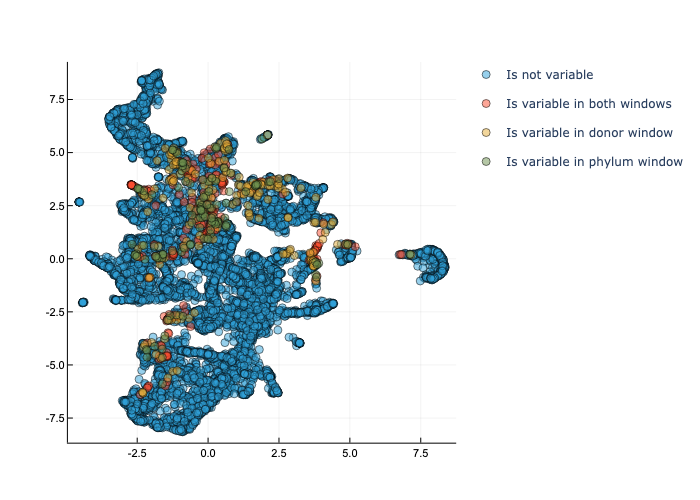

In [725]:
scatter(oggembedding_phylum[1, :], oggembedding_phylum[2,:], 
    size=(900,800),
    # group=uniprot.var.COG_categories,
    # group=arephylumvariable,
    group=classes,
    # marker_z=log10.(mapslices(var, Mprime_don, dims=1)[:]),
    alpha=.5,
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors),
    # c=:viridis
    )

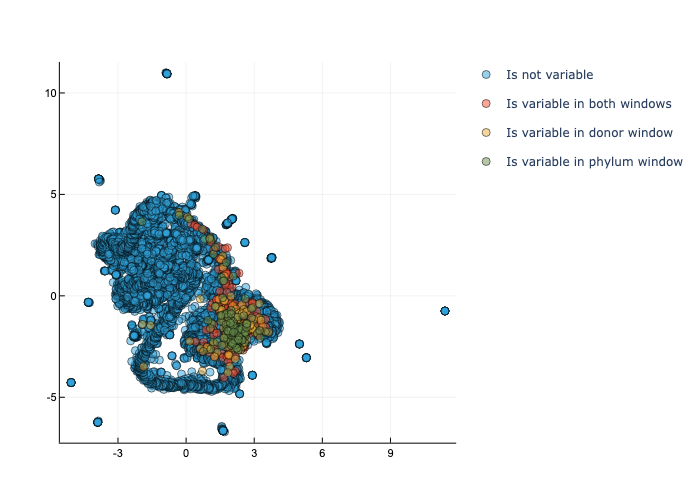

In [724]:
scatter(oggembedding_donor[1, :], oggembedding_donor[2,:], 
    size=(900,800),
    # group=uniprot.var.COG_categories,
    # group=arephylumvariable,
    group=classes,
    # marker_z=log10.(mapslices(var, Mprime_don, dims=1)[:]),
    alpha=.5,
    hover=uniprot.var.og .* ": " .* uniprot.var.description,
    legend=:outerright,
    c=permutedims(palette(:glasbey_hv_n256).colors.colors),
    # c=:viridis
    )

In [ ]:
Mprime_phy = BBuhat[:, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :];
Mprime_don = BBuhat[:, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

In [ ]:
arephylumvariable = replace(mapslices(var, Mprime_phy, dims=1)[:] .> 1, true=>"is variable", false=>"is not variable");
aredonor_variable = replace(mapslices(var, Mprime_don, dims=1)[:] .> 1, true=>"is variable", false=>"is not variable");

In [ ]:
whichphylumOGGsarevariable = findall(mapslices(var, Mprime_phy, dims=1)[:] .> 1)
whichdonorOGGsarevariable = findall(mapslices(var, Mprime_don, dims=1)[:] .> 1);

In [723]:
classes = repeat(["Is not variable"], size(UPusv.V, 1))
classes[setdiff(whichphylumOGGsarevariable, whichdonorOGGsarevariable)] .= "Is variable in phylum window"
classes[setdiff(whichdonorOGGsarevariable, whichphylumOGGsarevariable)] .= "Is variable in donor window"
classes[intersect(whichdonorOGGsarevariable, whichphylumOGGsarevariable)] .= "Is variable in both windows";

In [ ]:
setdiff(whichphylumOGGsarevariable, whichdonorOGGsarevariable)|>length,
intersect(whichphylumOGGsarevariable, whichdonorOGGsarevariable)|>length,
setdiff(whichdonorOGGsarevariable, whichphylumOGGsarevariable)|>length

In [ ]:
density(log10.(mapslices(var, Mprime_phy, dims=1)[:]) .- log10.(mapslices(var, Mprime_don, dims=1)[:]), fill=0)

In [ ]:
plot(ylabel="density", xlabel="OGG variance (log10)")
density!(log10.(mapslices(var, Mprime_phy, dims=1)[:]), fill=0, alpha=.3, label="Species window")
density!(log10.(mapslices(var, Mprime_don, dims=1)[:]), fill=0, alpha=.3, label="Donor window")

## Visualize nested variation

In [ ]:
intersect(pOGGs_a, pOGGs_b, pOGGs_r, dOGGs_a, dOGGs_b, dOGGs_r)

In [ ]:
hcat(speciesid[idxs], donorid[idxs])

In [ ]:
speciesdonor = hcat(speciesid[idxs], donorid[idxs])

In [ ]:
shareddonors = intersect(donorid[b_idxs]|>unique, donorid[r_idxs]|>unique)

In [ ]:
speciesdonor[findall(∈(shareddonors),donorid[idxs])]

In [ ]:
r_idxs

In [ ]:
shareddonoridxs = idxs[findall(∈(shareddonors),donorid[idxs])];
shareddonoridxs_b = b_idxs[findall(∈(shareddonors),donorid[b_idxs])];
shareddonoridxs_r = r_idxs[findall(∈(shareddonors),donorid[r_idxs])];

In [ ]:
intersect(shareddonoridxs_b, shareddonoridxs_r)

In [ ]:
sMprime_a_shareddonor = BBuhat[shareddonoridxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
pMprime_b_shareddonor = BBuhat[shareddonoridxs_b, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
sMprime_r_shareddonor = BBuhat[shareddonoridxs_r, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :]
dMprime_a_shareddonor = BBuhat[shareddonoridxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];
sMprime_b_shareddonor = BBuhat[shareddonoridxs_b, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];
dMprime_r_shareddonor = BBuhat[shareddonoridxs_r, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

In [ ]:
fOGG_a_shareddonor = findall(>(1), mapslices(var, bbmtx[shareddonoridxs, :], dims=1)[:]) 
fOGG_b_shareddonor = findall(>(1), mapslices(var, bbmtx[shareddonoridxs_b, :], dims=1)[:]) 
fOGG_r_shareddonor = findall(>(1), mapslices(var, bbmtx[shareddonoridxs_r, :], dims=1)[:]) 

sOGGs_a_shareddonor = findall(>(1), mapslices(var, sMprime_a_shareddonor, dims=1)[:]) 
dOGGs_a_shareddonor = findall(>(1), mapslices(var, pMprime_b_shareddonor, dims=1)[:]) 
sOGGs_b_shareddonor = findall(>(1), mapslices(var, sMprime_r_shareddonor, dims=1)[:]) 
dOGGs_b_shareddonor = findall(>(1), mapslices(var, dMprime_a_shareddonor, dims=1)[:]) 
sOGGs_r_shareddonor = findall(>(1), mapslices(var, sMprime_b_shareddonor, dims=1)[:])
dOGGs_r_shareddonor = findall(>(1), mapslices(var, dMprime_r_shareddonor, dims=1)[:]);

In [ ]:
rawvariableOGGs_full_shareddonor = intersect(fOGG_a_shareddonor, fOGG_b_shareddonor, fOGG_r_shareddonor);

In [ ]:
spectralvariableOGGs_shareddonor = intersect(
          sOGGs_a_shareddonor, sOGGs_b_shareddonor, sOGGs_r_shareddonor, 
          dOGGs_a_shareddonor, dOGGs_b_shareddonor, dOGGs_r_shareddonor
          )

In [ ]:
uniprot.var[spectralvariableOGGs_shareddonor, [:og, :description]]

In [ ]:
intersect(rawvariableOGGs_full_shareddonor, spectralvariableOGGs_shareddonor)

In [ ]:
rawvariableOGGs_full_shareddonor_sorted = rawvariableOGGs_full_shareddonor[
    sortperm(mapslices(var, bbmtx[shareddonoridxs, rawvariableOGGs_full_shareddonor], dims=1)[:], rev=true)];

In [ ]:
indexin(spectralvariableOGGs_shareddonor, rawvariableOGGs_full_shareddonor_sorted)

In [ ]:
shareddonors

In [ ]:
plotOGGs = spectralvariableOGGs_shareddonor
shapes = [:circle, :rect, :star5, :diamond, :hexagon, :cross]

plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="raw OGG abundunce",
    size=(1000,500),
    xticks=(1:length(plotOGGs), uniprot.var_names[plotOGGs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(plotOGGs)
    # species heterogeneity
    violin!([i], bbmtx[b_idxs, plotOGGs[i]], 
        side=:left, 
        c=groupcolors[2], 
        label=:none,
        trim=false)
    violin!([i], bbmtx[r_idxs, plotOGGs[i]], 
        side=:left, 
        c=groupcolors[3], 
        label=:none,
        trim=false)
    dotplot!([i], bbmtx[b_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[r_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    
    # donor heterogeneity
    for (j,donor_id) in enumerate(shareddonors)
        rowidxs_b = shareddonoridxs[intersect(
            findall(==(donor_id), donorid[shareddonoridxs]),
            findall(x->occursin.("uniformis",x), speciesid[shareddonoridxs])
        )]
        rowidxs_r = shareddonoridxs[intersect(
            findall(==(donor_id), donorid[shareddonoridxs]),
            findall(x->occursin.("luti",x), speciesid[shareddonoridxs])
        )]
        
        violin!([i], bbmtx[rowidxs_b, plotOGGs[i]], 
            side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        violin!([i], bbmtx[rowidxs_r, plotOGGs[i]], 
            side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        dotplot!([i], bbmtx[rowidxs_b, plotOGGs[i]], 
            side=:right, 
            c=:black,
            markershape=shapes[j],
            markersize=3, 
            label=:none,)
        dotplot!([i], bbmtx[rowidxs_r, plotOGGs[i]], 
            side=:right, 
            c=:black,
            markershape=shapes[j],
            markersize=3, 
            label=:none,)
    end
end
violin!()

In [ ]:
plotOGGs = spectralvariableOGGs_shareddonor
shapes = [:circle, :rect, :star5, :diamond, :hexagon, :cross]

plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="raw OGG abundunce",
    size=(1000,500),
    xticks=(1:length(plotOGGs), uniprot.var_names[plotOGGs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(plotOGGs)
    # species heterogeneity
    violin!([i], bbmtx[shareddonoridxs_b, plotOGGs[i]], 
        # side=:left, 
        c=groupcolors[2], 
        label=:none,
        trim=false)
    violin!([i], bbmtx[shareddonoridxs_r, plotOGGs[i]], 
        # side=:left, 
        c=groupcolors[3], 
        label=:none,
        trim=false)
    # dotplot!([i], bbmtx[b_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    # dotplot!([i], bbmtx[r_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    
    # donor heterogeneity
    for (j,donor_id) in enumerate(shareddonors)
        rowidxs = shareddonoridxs[findall(==(donor_id), donorid[shareddonoridxs])]
        # violin!([i], bbmtx[rowidxs, plotOGGs[i]], 
        #     side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        dotplot!([i], bbmtx[rowidxs, plotOGGs[i]], 
            # side=:right, 
            c=j, 
            markershape=shapes[j],
            markersize=5, 
            label=:none,
            trim=false)
    end
end
violin!()

In [ ]:
plotOGGs = rawvariableOGGs_full_shareddonor_sorted[1:10]
shapes = [:circle, :rect, :star5, :diamond, :hexagon, :cross]

plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="raw OGG abundunce",
    size=(1000,500),
    xticks=(1:length(plotOGGs), uniprot.var_names[plotOGGs]),
    xrotation=45,
    margin=5Plots.Measures.mm,
    clip=false,
)
for i in 1:length(plotOGGs)
    # species heterogeneity
    violin!([i], bbmtx[shareddonoridxs_b, plotOGGs[i]], 
        # side=:left, 
        c=groupcolors[2], 
        label=:none,
        trim=false)
    violin!([i], bbmtx[shareddonoridxs_r, plotOGGs[i]], 
        # side=:left, 
        c=groupcolors[3], 
        label=:none,
        trim=false)
    # dotplot!([i], bbmtx[b_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    # dotplot!([i], bbmtx[r_idxs, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    
    # donor heterogeneity
    for (j,donor_id) in enumerate(shareddonors)
        rowidxs = shareddonoridxs[findall(==(donor_id), donorid[shareddonoridxs])]
        # violin!([i], bbmtx[rowidxs, plotOGGs[i]], side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        dotplot!([i], bbmtx[rowidxs, plotOGGs[i]], 
            # side=:right, 
            c=j, 
            markershape=shapes[j],
            markersize=5, 
            label=:none,
            trim=false)
    end
end
violin!()

In [ ]:
plotOGGs = rawvariableOGGs_full_shareddonor_sorted[1:10]
shapes = [:circle, :rect, :star5, :diamond, :hexagon, :cross]

plot(
    title="Variable OGGs across B. luti & B. uniformis",
    ylabel="raw OGG abundunce",
    size=(1400,600),
    xticks=(1:length(plotOGGs), uniprot.var_names[plotOGGs]),
    xrotation=45,
    margin=10Plots.Measures.mm,
    clip=false,
)
for i in 1:length(plotOGGs)
    # species heterogeneity
    violin!([i], bbmtx[shareddonoridxs_b, plotOGGs[i]], 
        alpha=.5,
        side=:left, 
        c=groupcolors[2], 
        label=:none,
        trim=false)
    violin!([i], bbmtx[shareddonoridxs_r, plotOGGs[i]], 
        alpha=.5,
        side=:left, 
        c=groupcolors[3], 
        label=:none,
        trim=false)
    dotplot!([i], bbmtx[shareddonoridxs_b, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    dotplot!([i], bbmtx[shareddonoridxs_r, plotOGGs[i]], side=:left, c=:black, markersize=2, label=:none,trim=false)
    
    # donor heterogeneity
    for (j,donor_id) in enumerate(shareddonors)
        rowidxs_b = shareddonoridxs[intersect(
            findall(==(donor_id), donorid[shareddonoridxs]),
            findall(x->occursin.("uniformis",x), speciesid[shareddonoridxs])
        )]
        rowidxs_r = shareddonoridxs[intersect(
            findall(==(donor_id), donorid[shareddonoridxs]),
            findall(x->occursin.("luti",x), speciesid[shareddonoridxs])
        )]
        
        violin!([i], bbmtx[rowidxs_b, plotOGGs[i]], 
            side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        violin!([i], bbmtx[rowidxs_r, plotOGGs[i]], 
            side=:right,alpha=.1, c=donor_id,label=:none,trim=false)
        dotplot!([i], bbmtx[rowidxs_b, plotOGGs[i]], 
            side=:right, 
            c=:black,
            markershape=shapes[j],
            markersize=3, 
            label=:none,)
        dotplot!([i], bbmtx[rowidxs_r, plotOGGs[i]], 
            side=:right, 
            c=:black,
            markershape=shapes[j],
            markersize=3, 
            label=:none,)
    end
end
violin!()